# Copy train/tests folders
To avoid uploading large file size, the train, test1, and test2 folders are removed from our submissions.
Please kindly help to copy the folder train, test1, and test1 to this project folder (same location as this file).

# Dependency Installations
Please refer to the file `requirements.txt` for the list of packages used in this program. Some of the specific machine learning libraries, there will be codes regarding installations. However, for those common libraries (such as numpy, matplotlib, etc), we assumed that already available.

# Instructions
Please run the following sections starting from Splitting data until before the Training.
If you would like to continue the training process please consider increase the `max_iter` key in the configuration variable. If you do not want to run the training, it just run through the train section, it will skip the training since we've done the training.

Most of the data was pre-processed so will execute quickly. Those take longer time there was the time recorded using %timeit to let the users know how long it may take.

# Detectron2 installations
Make sure to install detectron2 and its dependencies by enabling the following lines if you haven't done so.


In [1]:
# # install dependencies:
# !pip install pycocotools>=2.0.1
# import torch
# print(torch.__version__, torch.cuda.is_available())
# !gcc --version
# # Make sure also to install opencv (assumed to be pre-installed)
# # install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# # See https://detectron2.readthedocs.io/tutorials/install.html for instructions
# assert torch.__version__.startswith("1.6")
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

# Splitting data

The stratify is by country and then by the damage type with lowest number of occurences.

In [2]:
 %load_ext autotime

In [3]:
from data_processing import split_train_data, process_tests, load_train_eval_splits, load_tests
import warnings
warnings.filterwarnings("ignore")

time: 1.18 s


In [4]:
# Process train/evaluation splits
split_train_data()

Records for train split exists
Records for evaluation split exists
time: 1.22 ms


In [5]:
# Process tests
process_tests(["test1", "test2"])

test1 exists
test2 exists
time: 1.23 ms


# Loading the processed data

In [6]:
train_dicts, eval_dicts = load_train_eval_splits()
test1_dicts, test2_dicts = load_tests()

time: 141 ms


In [7]:
print(len(train_dicts), len(eval_dicts), len(test1_dicts), len(test2_dicts))

10974 1221 2631 2664
time: 904 µs


# Data Exploration
See split balance

In [8]:
from vis_utils import plot_damage_distributions

time: 261 ms


0 : 5923
1 : 3992
2 : 7513
3 : 5044


[5923, 3992, 7513, 5044]

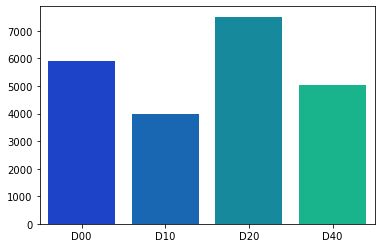

time: 183 ms


In [9]:
plot_damage_distributions(train_dicts)

0 : 669
1 : 454
2 : 868
3 : 583


[669, 454, 868, 583]

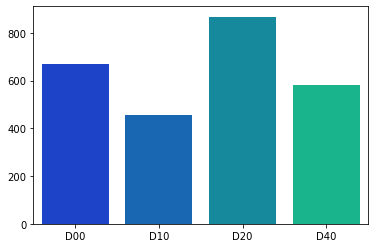

time: 99.8 ms


In [10]:
plot_damage_distributions(eval_dicts)

In [11]:
# Import dependencies
import torch
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from cv2 import imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import ColorMode

import time
import datetime

time: 5.35 ms


# Data Preparation

In [12]:
model_type='x101'
OUTPUT_DIR = f'./{model_type}_output'
OUTPUT_DIR

'./x101_output'

time: 3.39 ms


In [13]:
from data_processing import prepare_data
road_damage_metadata = prepare_data(OUTPUT_DIR, train_dicts, eval_dicts, test1_dicts, test2_dicts)

[10/22 09:25:41 d2.data.datasets.coco]: Converting annotations of dataset 'road_damage_train' to COCO format ...)
[10/22 09:25:41 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[10/22 09:25:44 d2.data.datasets.coco]: Conversion finished, #images: 10974, #annotations: 22472
[10/22 09:25:44 d2.data.datasets.coco]: Caching COCO format annotations at './x101_output/road_damage_train_coco_format.json' ...
[10/22 09:25:44 d2.data.datasets.coco]: Converting annotations of dataset 'road_damage_eval' to COCO format ...)
[10/22 09:25:44 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[10/22 09:25:45 d2.data.datasets.coco]: Conversion finished, #images: 1221, #annotations: 2574
[10/22 09:25:45 d2.data.datasets.coco]: Caching COCO format annotations at './x101_output/road_damage_eval_coco_format.json' ...
[10/22 09:25:45 d2.data.datasets.coco]: Converting annotations of dataset 'road_damage_test1' to COCO format ...)
[10/22 09:25:45 d2.data.datasets.coco]: Conv

In [39]:
from train_helper import configure_model
train_config = {
    'OUTPUT_DIR': OUTPUT_DIR,
    'base_config_file': "COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml", #'COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml', # X101 is more accurate but slow
    'base_weight_file': "detectron2://ImageNetPretrained/FAIR/X-101-32x8d.pkl", #'detectron2://ImageNetPretrained/MSRA/R-101.pkl', # X101 is more accurate but slow
    'max_iter': 70000,
    'num_gpus': 2,
    'ims_per_batch': 16,
    'learning_rate': 0.00025
}
cfg = configure_model(**train_config)

time: 26.8 ms


# Training
If you would like to continue the training process please increase the `max_iter` field in the previous cell, otherwise you can continue to run or safely skip the training cell. If you continue to run without changing `max_iter`, since we resume from previous epochs, so it will stop (it is not an error, just continue to evaluation part).

In [40]:
from my_detectron2_trainer import MyTrainer

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = MyTrainer(cfg) 
trainer.resume_or_load(resume=True)
trainer.train()

[10/22 21:10:21 d2.engine.defaults]: Auto-scaling the config to batch_size=8, learning_rate=0.000125, max_iter=140000, warmup=2000.
[10/22 21:10:22 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), st

WARNING [10/22 21:10:23 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/22 21:10:23 d2.data.datasets.coco]: Loaded 10974 images in COCO format from ./x101_output/road_damage_train_coco_format.json
[10/22 21:10:23 d2.data.build]: Removed 0 images with no usable annotations. 10974 images left.
[10/22 21:10:23 d2.data.common]: Serializing 10974 elements to byte tensors and concatenating them all ...
[10/22 21:10:23 d2.data.common]: Serialized dataset takes 3.83 MiB
[10/22 21:10:23 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[10/22 21:10:23 d2.data.build]: Using training sampler TrainingSampler
[10/22 21:10:23 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]


[10/22 21:26:27 d2.utils.events]:  eta: 9:10:49  iter: 120579  total_loss: 0.499  loss_cls: 0.147  loss_box_reg: 0.257  loss_rpn_cls: 0.016  loss_rpn_loc: 0.083  time: 1.6582  data_time: 0.0134  lr: 0.000013  max_mem: 13180M
[10/22 21:27:00 d2.utils.events]:  eta: 9:10:17  iter: 120599  total_loss: 0.494  loss_cls: 0.135  loss_box_reg: 0.255  loss_rpn_cls: 0.012  loss_rpn_loc: 0.088  time: 1.6576  data_time: 0.0141  lr: 0.000013  max_mem: 13180M
[10/22 21:27:33 d2.utils.events]:  eta: 9:09:45  iter: 120619  total_loss: 0.538  loss_cls: 0.147  loss_box_reg: 0.277  loss_rpn_cls: 0.021  loss_rpn_loc: 0.101  time: 1.6574  data_time: 0.0127  lr: 0.000013  max_mem: 13180M
[10/22 21:28:07 d2.utils.events]:  eta: 9:09:13  iter: 120639  total_loss: 0.519  loss_cls: 0.131  loss_box_reg: 0.263  loss_rpn_cls: 0.018  loss_rpn_loc: 0.094  time: 1.6582  data_time: 0.0143  lr: 0.000013  max_mem: 13180M
[10/22 21:28:40 d2.utils.events]:  eta: 9:08:40  iter: 120659  total_loss: 0.572  loss_cls: 0.140  l

[10/22 21:46:26 d2.utils.events]:  eta: 8:51:21  iter: 121299  total_loss: 0.545  loss_cls: 0.148  loss_box_reg: 0.281  loss_rpn_cls: 0.013  loss_rpn_loc: 0.106  time: 1.6617  data_time: 0.0151  lr: 0.000013  max_mem: 13180M
[10/22 21:46:59 d2.utils.events]:  eta: 8:50:47  iter: 121319  total_loss: 0.496  loss_cls: 0.130  loss_box_reg: 0.252  loss_rpn_cls: 0.017  loss_rpn_loc: 0.092  time: 1.6615  data_time: 0.0142  lr: 0.000013  max_mem: 13180M
[10/22 21:47:32 d2.utils.events]:  eta: 8:50:11  iter: 121339  total_loss: 0.494  loss_cls: 0.128  loss_box_reg: 0.248  loss_rpn_cls: 0.017  loss_rpn_loc: 0.091  time: 1.6614  data_time: 0.0138  lr: 0.000013  max_mem: 13180M
[10/22 21:48:06 d2.utils.events]:  eta: 8:49:38  iter: 121359  total_loss: 0.528  loss_cls: 0.140  loss_box_reg: 0.275  loss_rpn_cls: 0.016  loss_rpn_loc: 0.100  time: 1.6617  data_time: 0.0142  lr: 0.000013  max_mem: 13180M
[10/22 21:48:40 d2.utils.events]:  eta: 8:49:02  iter: 121379  total_loss: 0.537  loss_cls: 0.144  l

[10/22 22:06:28 d2.utils.events]:  eta: 8:30:51  iter: 122019  total_loss: 0.518  loss_cls: 0.139  loss_box_reg: 0.269  loss_rpn_cls: 0.015  loss_rpn_loc: 0.091  time: 1.6642  data_time: 0.0136  lr: 0.000013  max_mem: 13180M
[10/22 22:07:02 d2.utils.events]:  eta: 8:30:18  iter: 122039  total_loss: 0.500  loss_cls: 0.129  loss_box_reg: 0.269  loss_rpn_cls: 0.015  loss_rpn_loc: 0.088  time: 1.6643  data_time: 0.0131  lr: 0.000013  max_mem: 13180M
[10/22 22:07:35 d2.utils.events]:  eta: 8:29:44  iter: 122059  total_loss: 0.490  loss_cls: 0.134  loss_box_reg: 0.243  loss_rpn_cls: 0.013  loss_rpn_loc: 0.082  time: 1.6642  data_time: 0.0141  lr: 0.000013  max_mem: 13180M
[10/22 22:08:09 d2.utils.events]:  eta: 8:29:09  iter: 122079  total_loss: 0.495  loss_cls: 0.139  loss_box_reg: 0.236  loss_rpn_cls: 0.018  loss_rpn_loc: 0.090  time: 1.6645  data_time: 0.0132  lr: 0.000013  max_mem: 13180M
[10/22 22:08:42 d2.utils.events]:  eta: 8:28:34  iter: 122099  total_loss: 0.498  loss_cls: 0.132  l

[10/22 22:26:28 d2.utils.events]:  eta: 8:10:21  iter: 122739  total_loss: 0.561  loss_cls: 0.146  loss_box_reg: 0.290  loss_rpn_cls: 0.016  loss_rpn_loc: 0.086  time: 1.6645  data_time: 0.0146  lr: 0.000013  max_mem: 13180M
[10/22 22:27:02 d2.utils.events]:  eta: 8:09:48  iter: 122759  total_loss: 0.483  loss_cls: 0.137  loss_box_reg: 0.257  loss_rpn_cls: 0.015  loss_rpn_loc: 0.085  time: 1.6646  data_time: 0.0142  lr: 0.000013  max_mem: 13180M
[10/22 22:27:34 d2.utils.events]:  eta: 8:09:13  iter: 122779  total_loss: 0.514  loss_cls: 0.136  loss_box_reg: 0.259  loss_rpn_cls: 0.015  loss_rpn_loc: 0.101  time: 1.6644  data_time: 0.0144  lr: 0.000013  max_mem: 13180M
[10/22 22:28:07 d2.utils.events]:  eta: 8:08:38  iter: 122799  total_loss: 0.521  loss_cls: 0.139  loss_box_reg: 0.264  loss_rpn_cls: 0.018  loss_rpn_loc: 0.099  time: 1.6641  data_time: 0.0135  lr: 0.000013  max_mem: 13180M
[10/22 22:28:41 d2.utils.events]:  eta: 8:08:03  iter: 122819  total_loss: 0.517  loss_cls: 0.136  l

[10/22 22:46:27 d2.utils.events]:  eta: 7:49:47  iter: 123459  total_loss: 0.495  loss_cls: 0.133  loss_box_reg: 0.237  loss_rpn_cls: 0.017  loss_rpn_loc: 0.089  time: 1.6646  data_time: 0.0153  lr: 0.000013  max_mem: 13180M
[10/22 22:47:01 d2.utils.events]:  eta: 7:49:15  iter: 123479  total_loss: 0.494  loss_cls: 0.136  loss_box_reg: 0.262  loss_rpn_cls: 0.016  loss_rpn_loc: 0.090  time: 1.6646  data_time: 0.0149  lr: 0.000013  max_mem: 13180M
[10/22 22:47:34 d2.utils.events]:  eta: 7:48:41  iter: 123499  total_loss: 0.515  loss_cls: 0.150  loss_box_reg: 0.259  loss_rpn_cls: 0.014  loss_rpn_loc: 0.090  time: 1.6647  data_time: 0.0143  lr: 0.000013  max_mem: 13180M
[10/22 22:48:08 d2.utils.events]:  eta: 7:48:07  iter: 123519  total_loss: 0.545  loss_cls: 0.143  loss_box_reg: 0.286  loss_rpn_cls: 0.017  loss_rpn_loc: 0.094  time: 1.6647  data_time: 0.0144  lr: 0.000013  max_mem: 13180M
[10/22 22:48:40 d2.utils.events]:  eta: 7:47:32  iter: 123539  total_loss: 0.499  loss_cls: 0.143  l

[10/22 23:06:26 d2.utils.events]:  eta: 7:29:38  iter: 124179  total_loss: 0.523  loss_cls: 0.142  loss_box_reg: 0.261  loss_rpn_cls: 0.018  loss_rpn_loc: 0.080  time: 1.6645  data_time: 0.0155  lr: 0.000013  max_mem: 13180M
[10/22 23:06:59 d2.utils.events]:  eta: 7:29:02  iter: 124199  total_loss: 0.517  loss_cls: 0.143  loss_box_reg: 0.259  loss_rpn_cls: 0.013  loss_rpn_loc: 0.091  time: 1.6645  data_time: 0.0142  lr: 0.000013  max_mem: 13180M
[10/22 23:07:32 d2.utils.events]:  eta: 7:28:29  iter: 124219  total_loss: 0.479  loss_cls: 0.122  loss_box_reg: 0.250  loss_rpn_cls: 0.019  loss_rpn_loc: 0.097  time: 1.6645  data_time: 0.0142  lr: 0.000013  max_mem: 13180M
[10/22 23:08:05 d2.utils.events]:  eta: 7:27:55  iter: 124239  total_loss: 0.480  loss_cls: 0.126  loss_box_reg: 0.252  loss_rpn_cls: 0.014  loss_rpn_loc: 0.092  time: 1.6643  data_time: 0.0134  lr: 0.000013  max_mem: 13180M
[10/22 23:08:38 d2.utils.events]:  eta: 7:27:18  iter: 124259  total_loss: 0.567  loss_cls: 0.148  l

[10/22 23:26:25 d2.utils.events]:  eta: 7:09:02  iter: 124899  total_loss: 0.533  loss_cls: 0.139  loss_box_reg: 0.264  loss_rpn_cls: 0.018  loss_rpn_loc: 0.099  time: 1.6645  data_time: 0.0147  lr: 0.000013  max_mem: 13180M
[10/22 23:26:58 d2.utils.events]:  eta: 7:08:27  iter: 124919  total_loss: 0.471  loss_cls: 0.130  loss_box_reg: 0.241  loss_rpn_cls: 0.015  loss_rpn_loc: 0.104  time: 1.6645  data_time: 0.0146  lr: 0.000013  max_mem: 13180M
[10/22 23:27:30 d2.utils.events]:  eta: 7:07:53  iter: 124939  total_loss: 0.476  loss_cls: 0.127  loss_box_reg: 0.251  loss_rpn_cls: 0.018  loss_rpn_loc: 0.090  time: 1.6643  data_time: 0.0147  lr: 0.000013  max_mem: 13180M
[10/22 23:28:04 d2.utils.events]:  eta: 7:07:18  iter: 124959  total_loss: 0.480  loss_cls: 0.131  loss_box_reg: 0.254  loss_rpn_cls: 0.014  loss_rpn_loc: 0.087  time: 1.6643  data_time: 0.0156  lr: 0.000013  max_mem: 13180M
[10/22 23:28:38 d2.utils.events]:  eta: 7:06:44  iter: 124979  total_loss: 0.496  loss_cls: 0.128  l

[10/22 23:46:27 d2.utils.events]:  eta: 6:48:38  iter: 125619  total_loss: 0.507  loss_cls: 0.137  loss_box_reg: 0.244  loss_rpn_cls: 0.014  loss_rpn_loc: 0.101  time: 1.6648  data_time: 0.0134  lr: 0.000013  max_mem: 13180M
[10/22 23:47:01 d2.utils.events]:  eta: 6:48:05  iter: 125639  total_loss: 0.499  loss_cls: 0.141  loss_box_reg: 0.253  loss_rpn_cls: 0.016  loss_rpn_loc: 0.100  time: 1.6648  data_time: 0.0138  lr: 0.000013  max_mem: 13180M
[10/22 23:47:33 d2.utils.events]:  eta: 6:47:30  iter: 125659  total_loss: 0.546  loss_cls: 0.149  loss_box_reg: 0.282  loss_rpn_cls: 0.020  loss_rpn_loc: 0.097  time: 1.6648  data_time: 0.0143  lr: 0.000013  max_mem: 13180M
[10/22 23:48:07 d2.utils.events]:  eta: 6:46:57  iter: 125679  total_loss: 0.555  loss_cls: 0.160  loss_box_reg: 0.278  loss_rpn_cls: 0.020  loss_rpn_loc: 0.102  time: 1.6648  data_time: 0.0146  lr: 0.000013  max_mem: 13180M
[10/22 23:48:40 d2.utils.events]:  eta: 6:46:23  iter: 125699  total_loss: 0.443  loss_cls: 0.116  l

[10/23 00:06:28 d2.utils.events]:  eta: 6:28:10  iter: 126339  total_loss: 0.495  loss_cls: 0.130  loss_box_reg: 0.248  loss_rpn_cls: 0.016  loss_rpn_loc: 0.093  time: 1.6650  data_time: 0.0142  lr: 0.000013  max_mem: 13180M
[10/23 00:07:01 d2.utils.events]:  eta: 6:27:36  iter: 126359  total_loss: 0.524  loss_cls: 0.154  loss_box_reg: 0.256  loss_rpn_cls: 0.018  loss_rpn_loc: 0.103  time: 1.6650  data_time: 0.0144  lr: 0.000013  max_mem: 13180M
[10/23 00:07:34 d2.utils.events]:  eta: 6:27:00  iter: 126379  total_loss: 0.524  loss_cls: 0.139  loss_box_reg: 0.278  loss_rpn_cls: 0.015  loss_rpn_loc: 0.085  time: 1.6650  data_time: 0.0148  lr: 0.000013  max_mem: 13180M
[10/23 00:08:08 d2.utils.events]:  eta: 6:26:26  iter: 126399  total_loss: 0.494  loss_cls: 0.141  loss_box_reg: 0.254  loss_rpn_cls: 0.018  loss_rpn_loc: 0.093  time: 1.6650  data_time: 0.0152  lr: 0.000013  max_mem: 13180M
[10/23 00:08:41 d2.utils.events]:  eta: 6:25:51  iter: 126419  total_loss: 0.489  loss_cls: 0.130  l

[10/23 00:26:29 d2.utils.events]:  eta: 6:07:40  iter: 127059  total_loss: 0.496  loss_cls: 0.126  loss_box_reg: 0.255  loss_rpn_cls: 0.014  loss_rpn_loc: 0.099  time: 1.6653  data_time: 0.0149  lr: 0.000013  max_mem: 13180M
[10/23 00:27:03 d2.utils.events]:  eta: 6:07:06  iter: 127079  total_loss: 0.513  loss_cls: 0.127  loss_box_reg: 0.271  loss_rpn_cls: 0.017  loss_rpn_loc: 0.093  time: 1.6654  data_time: 0.0135  lr: 0.000013  max_mem: 13180M
[10/23 00:27:36 d2.utils.events]:  eta: 6:06:32  iter: 127099  total_loss: 0.497  loss_cls: 0.137  loss_box_reg: 0.253  loss_rpn_cls: 0.017  loss_rpn_loc: 0.085  time: 1.6653  data_time: 0.0151  lr: 0.000013  max_mem: 13180M
[10/23 00:28:09 d2.utils.events]:  eta: 6:05:58  iter: 127119  total_loss: 0.536  loss_cls: 0.133  loss_box_reg: 0.259  loss_rpn_cls: 0.019  loss_rpn_loc: 0.097  time: 1.6653  data_time: 0.0151  lr: 0.000013  max_mem: 13180M
[10/23 00:28:43 d2.utils.events]:  eta: 6:05:24  iter: 127139  total_loss: 0.507  loss_cls: 0.129  l

[10/23 00:46:36 d2.utils.events]:  eta: 5:47:16  iter: 127779  total_loss: 0.503  loss_cls: 0.139  loss_box_reg: 0.269  loss_rpn_cls: 0.015  loss_rpn_loc: 0.089  time: 1.6663  data_time: 0.0138  lr: 0.000013  max_mem: 13180M
[10/23 00:47:10 d2.utils.events]:  eta: 5:46:43  iter: 127799  total_loss: 0.559  loss_cls: 0.144  loss_box_reg: 0.289  loss_rpn_cls: 0.018  loss_rpn_loc: 0.100  time: 1.6663  data_time: 0.0141  lr: 0.000013  max_mem: 13180M
[10/23 00:47:43 d2.utils.events]:  eta: 5:46:08  iter: 127819  total_loss: 0.498  loss_cls: 0.141  loss_box_reg: 0.246  loss_rpn_cls: 0.012  loss_rpn_loc: 0.091  time: 1.6663  data_time: 0.0133  lr: 0.000013  max_mem: 13180M
[10/23 00:48:17 d2.utils.events]:  eta: 5:45:34  iter: 127839  total_loss: 0.511  loss_cls: 0.131  loss_box_reg: 0.256  loss_rpn_cls: 0.021  loss_rpn_loc: 0.096  time: 1.6663  data_time: 0.0150  lr: 0.000013  max_mem: 13180M
[10/23 00:48:50 d2.utils.events]:  eta: 5:45:00  iter: 127859  total_loss: 0.545  loss_cls: 0.148  l

[10/23 01:06:37 d2.utils.events]:  eta: 5:26:37  iter: 128499  total_loss: 0.494  loss_cls: 0.117  loss_box_reg: 0.258  loss_rpn_cls: 0.015  loss_rpn_loc: 0.093  time: 1.6663  data_time: 0.0142  lr: 0.000013  max_mem: 13180M
[10/23 01:07:10 d2.utils.events]:  eta: 5:26:02  iter: 128519  total_loss: 0.523  loss_cls: 0.137  loss_box_reg: 0.257  loss_rpn_cls: 0.018  loss_rpn_loc: 0.095  time: 1.6663  data_time: 0.0142  lr: 0.000013  max_mem: 13180M
[10/23 01:07:43 d2.utils.events]:  eta: 5:25:28  iter: 128539  total_loss: 0.522  loss_cls: 0.133  loss_box_reg: 0.249  loss_rpn_cls: 0.021  loss_rpn_loc: 0.110  time: 1.6663  data_time: 0.0147  lr: 0.000013  max_mem: 13180M
[10/23 01:08:16 d2.utils.events]:  eta: 5:24:54  iter: 128559  total_loss: 0.538  loss_cls: 0.137  loss_box_reg: 0.279  loss_rpn_cls: 0.017  loss_rpn_loc: 0.099  time: 1.6662  data_time: 0.0141  lr: 0.000013  max_mem: 13180M
[10/23 01:08:50 d2.utils.events]:  eta: 5:24:20  iter: 128579  total_loss: 0.509  loss_cls: 0.128  l

[10/23 01:26:36 d2.utils.events]:  eta: 5:06:09  iter: 129219  total_loss: 0.501  loss_cls: 0.140  loss_box_reg: 0.256  loss_rpn_cls: 0.014  loss_rpn_loc: 0.082  time: 1.6662  data_time: 0.0147  lr: 0.000013  max_mem: 13180M
[10/23 01:27:09 d2.utils.events]:  eta: 5:05:35  iter: 129239  total_loss: 0.516  loss_cls: 0.149  loss_box_reg: 0.268  loss_rpn_cls: 0.013  loss_rpn_loc: 0.097  time: 1.6662  data_time: 0.0138  lr: 0.000013  max_mem: 13180M
[10/23 01:27:43 d2.utils.events]:  eta: 5:05:01  iter: 129259  total_loss: 0.503  loss_cls: 0.125  loss_box_reg: 0.244  loss_rpn_cls: 0.012  loss_rpn_loc: 0.092  time: 1.6662  data_time: 0.0152  lr: 0.000013  max_mem: 13180M
[10/23 01:28:16 d2.utils.events]:  eta: 5:04:27  iter: 129279  total_loss: 0.515  loss_cls: 0.140  loss_box_reg: 0.276  loss_rpn_cls: 0.016  loss_rpn_loc: 0.091  time: 1.6661  data_time: 0.0139  lr: 0.000013  max_mem: 13180M
[10/23 01:28:49 d2.utils.events]:  eta: 5:03:52  iter: 129299  total_loss: 0.469  loss_cls: 0.128  l

[10/23 01:46:38 d2.utils.events]:  eta: 4:45:47  iter: 129939  total_loss: 0.487  loss_cls: 0.130  loss_box_reg: 0.250  loss_rpn_cls: 0.014  loss_rpn_loc: 0.085  time: 1.6663  data_time: 0.0136  lr: 0.000013  max_mem: 13180M
[10/23 01:47:12 d2.utils.events]:  eta: 4:45:14  iter: 129959  total_loss: 0.463  loss_cls: 0.133  loss_box_reg: 0.235  loss_rpn_cls: 0.016  loss_rpn_loc: 0.084  time: 1.6664  data_time: 0.0139  lr: 0.000013  max_mem: 13180M
[10/23 01:47:45 d2.utils.events]:  eta: 4:44:40  iter: 129979  total_loss: 0.508  loss_cls: 0.137  loss_box_reg: 0.261  loss_rpn_cls: 0.019  loss_rpn_loc: 0.093  time: 1.6664  data_time: 0.0141  lr: 0.000013  max_mem: 13180M
WARNING [10/23 01:48:20 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/23 01:48:20 d2.data.datasets.coco]: Loaded 1221 images in COCO format from ./x101_output/road_damage_eval_coco_format.json
[10/23 01:48:20 d2.data.common]: Serializing 1221 elements t

[10/23 01:55:43 d2.utils.events]:  eta: 4:40:04  iter: 130139  total_loss: 0.492  loss_cls: 0.131  loss_box_reg: 0.248  loss_rpn_cls: 0.015  loss_rpn_loc: 0.084  validation_loss: 1.033  time: 1.6664  data_time: 0.0140  lr: 0.000013  max_mem: 13180M
[10/23 01:56:16 d2.utils.events]:  eta: 4:39:30  iter: 130159  total_loss: 0.489  loss_cls: 0.119  loss_box_reg: 0.254  loss_rpn_cls: 0.016  loss_rpn_loc: 0.095  validation_loss: 1.033  time: 1.6664  data_time: 0.0146  lr: 0.000013  max_mem: 13180M
[10/23 01:56:49 d2.utils.events]:  eta: 4:38:55  iter: 130179  total_loss: 0.488  loss_cls: 0.126  loss_box_reg: 0.242  loss_rpn_cls: 0.019  loss_rpn_loc: 0.090  validation_loss: 1.033  time: 1.6664  data_time: 0.0136  lr: 0.000013  max_mem: 13180M
[10/23 01:57:22 d2.utils.events]:  eta: 4:38:20  iter: 130199  total_loss: 0.530  loss_cls: 0.139  loss_box_reg: 0.264  loss_rpn_cls: 0.017  loss_rpn_loc: 0.101  validation_loss: 1.033  time: 1.6664  data_time: 0.0141  lr: 0.000013  max_mem: 13180M
[10/

[10/23 02:13:27 d2.utils.events]:  eta: 4:21:41  iter: 130779  total_loss: 0.475  loss_cls: 0.121  loss_box_reg: 0.234  loss_rpn_cls: 0.015  loss_rpn_loc: 0.092  validation_loss: 1.033  time: 1.6661  data_time: 0.0146  lr: 0.000013  max_mem: 13180M
[10/23 02:14:01 d2.utils.events]:  eta: 4:21:08  iter: 130799  total_loss: 0.533  loss_cls: 0.146  loss_box_reg: 0.277  loss_rpn_cls: 0.014  loss_rpn_loc: 0.094  validation_loss: 1.033  time: 1.6662  data_time: 0.0153  lr: 0.000013  max_mem: 13180M
[10/23 02:14:35 d2.utils.events]:  eta: 4:20:33  iter: 130819  total_loss: 0.505  loss_cls: 0.129  loss_box_reg: 0.256  loss_rpn_cls: 0.014  loss_rpn_loc: 0.098  validation_loss: 1.033  time: 1.6663  data_time: 0.0144  lr: 0.000013  max_mem: 13180M
[10/23 02:15:08 d2.utils.events]:  eta: 4:19:59  iter: 130839  total_loss: 0.482  loss_cls: 0.129  loss_box_reg: 0.256  loss_rpn_cls: 0.015  loss_rpn_loc: 0.100  validation_loss: 1.033  time: 1.6663  data_time: 0.0147  lr: 0.000013  max_mem: 13180M
[10/

[10/23 02:31:16 d2.utils.events]:  eta: 4:03:31  iter: 131419  total_loss: 0.498  loss_cls: 0.123  loss_box_reg: 0.251  loss_rpn_cls: 0.014  loss_rpn_loc: 0.088  validation_loss: 1.033  time: 1.6663  data_time: 0.0145  lr: 0.000013  max_mem: 13180M
[10/23 02:31:49 d2.utils.events]:  eta: 4:02:56  iter: 131439  total_loss: 0.532  loss_cls: 0.147  loss_box_reg: 0.267  loss_rpn_cls: 0.017  loss_rpn_loc: 0.091  validation_loss: 1.033  time: 1.6663  data_time: 0.0139  lr: 0.000013  max_mem: 13180M
[10/23 02:32:22 d2.utils.events]:  eta: 4:02:21  iter: 131459  total_loss: 0.509  loss_cls: 0.136  loss_box_reg: 0.261  loss_rpn_cls: 0.018  loss_rpn_loc: 0.102  validation_loss: 1.033  time: 1.6663  data_time: 0.0145  lr: 0.000013  max_mem: 13180M
[10/23 02:32:55 d2.utils.events]:  eta: 4:01:46  iter: 131479  total_loss: 0.524  loss_cls: 0.133  loss_box_reg: 0.288  loss_rpn_cls: 0.018  loss_rpn_loc: 0.094  validation_loss: 1.033  time: 1.6662  data_time: 0.0141  lr: 0.000013  max_mem: 13180M
[10/

[10/23 02:49:04 d2.utils.events]:  eta: 3:45:19  iter: 132059  total_loss: 0.504  loss_cls: 0.139  loss_box_reg: 0.256  loss_rpn_cls: 0.016  loss_rpn_loc: 0.089  validation_loss: 1.033  time: 1.6664  data_time: 0.0138  lr: 0.000013  max_mem: 13180M
[10/23 02:49:37 d2.utils.events]:  eta: 3:44:45  iter: 132079  total_loss: 0.543  loss_cls: 0.135  loss_box_reg: 0.271  loss_rpn_cls: 0.020  loss_rpn_loc: 0.098  validation_loss: 1.033  time: 1.6664  data_time: 0.0148  lr: 0.000013  max_mem: 13180M
[10/23 02:50:10 d2.utils.events]:  eta: 3:44:10  iter: 132099  total_loss: 0.443  loss_cls: 0.120  loss_box_reg: 0.231  loss_rpn_cls: 0.014  loss_rpn_loc: 0.079  validation_loss: 1.033  time: 1.6663  data_time: 0.0133  lr: 0.000013  max_mem: 13180M
[10/23 02:50:43 d2.utils.events]:  eta: 3:43:36  iter: 132119  total_loss: 0.511  loss_cls: 0.143  loss_box_reg: 0.270  loss_rpn_cls: 0.014  loss_rpn_loc: 0.100  validation_loss: 1.033  time: 1.6663  data_time: 0.0136  lr: 0.000013  max_mem: 13180M
[10/

[10/23 03:06:53 d2.utils.events]:  eta: 3:27:10  iter: 132699  total_loss: 0.549  loss_cls: 0.154  loss_box_reg: 0.275  loss_rpn_cls: 0.017  loss_rpn_loc: 0.088  validation_loss: 1.033  time: 1.6666  data_time: 0.0145  lr: 0.000013  max_mem: 13180M
[10/23 03:07:27 d2.utils.events]:  eta: 3:26:36  iter: 132719  total_loss: 0.482  loss_cls: 0.128  loss_box_reg: 0.255  loss_rpn_cls: 0.015  loss_rpn_loc: 0.092  validation_loss: 1.033  time: 1.6666  data_time: 0.0144  lr: 0.000013  max_mem: 13180M
[10/23 03:08:00 d2.utils.events]:  eta: 3:26:02  iter: 132739  total_loss: 0.493  loss_cls: 0.132  loss_box_reg: 0.256  loss_rpn_cls: 0.016  loss_rpn_loc: 0.094  validation_loss: 1.033  time: 1.6666  data_time: 0.0143  lr: 0.000013  max_mem: 13180M
[10/23 03:08:34 d2.utils.events]:  eta: 3:25:28  iter: 132759  total_loss: 0.542  loss_cls: 0.153  loss_box_reg: 0.285  loss_rpn_cls: 0.012  loss_rpn_loc: 0.094  validation_loss: 1.033  time: 1.6666  data_time: 0.0136  lr: 0.000013  max_mem: 13180M
[10/

[10/23 03:24:43 d2.utils.events]:  eta: 3:08:58  iter: 133339  total_loss: 0.505  loss_cls: 0.130  loss_box_reg: 0.273  loss_rpn_cls: 0.015  loss_rpn_loc: 0.081  validation_loss: 1.033  time: 1.6668  data_time: 0.0136  lr: 0.000013  max_mem: 13180M
[10/23 03:25:16 d2.utils.events]:  eta: 3:08:24  iter: 133359  total_loss: 0.522  loss_cls: 0.150  loss_box_reg: 0.261  loss_rpn_cls: 0.019  loss_rpn_loc: 0.084  validation_loss: 1.033  time: 1.6667  data_time: 0.0143  lr: 0.000013  max_mem: 13180M
[10/23 03:25:49 d2.utils.events]:  eta: 3:07:50  iter: 133379  total_loss: 0.501  loss_cls: 0.133  loss_box_reg: 0.258  loss_rpn_cls: 0.013  loss_rpn_loc: 0.082  validation_loss: 1.033  time: 1.6667  data_time: 0.0137  lr: 0.000013  max_mem: 13180M
[10/23 03:26:22 d2.utils.events]:  eta: 3:07:16  iter: 133399  total_loss: 0.543  loss_cls: 0.144  loss_box_reg: 0.275  loss_rpn_cls: 0.016  loss_rpn_loc: 0.113  validation_loss: 1.033  time: 1.6667  data_time: 0.0136  lr: 0.000013  max_mem: 13180M
[10/

[10/23 03:42:27 d2.utils.events]:  eta: 2:50:45  iter: 133979  total_loss: 0.475  loss_cls: 0.121  loss_box_reg: 0.235  loss_rpn_cls: 0.013  loss_rpn_loc: 0.091  validation_loss: 1.033  time: 1.6665  data_time: 0.0136  lr: 0.000013  max_mem: 13180M
[10/23 03:43:00 d2.utils.events]:  eta: 2:50:11  iter: 133999  total_loss: 0.466  loss_cls: 0.114  loss_box_reg: 0.242  loss_rpn_cls: 0.015  loss_rpn_loc: 0.086  validation_loss: 1.033  time: 1.6666  data_time: 0.0142  lr: 0.000013  max_mem: 13180M
[10/23 03:43:33 d2.utils.events]:  eta: 2:49:37  iter: 134019  total_loss: 0.517  loss_cls: 0.142  loss_box_reg: 0.273  loss_rpn_cls: 0.016  loss_rpn_loc: 0.094  validation_loss: 1.033  time: 1.6665  data_time: 0.0134  lr: 0.000013  max_mem: 13180M
[10/23 03:44:07 d2.utils.events]:  eta: 2:49:03  iter: 134039  total_loss: 0.566  loss_cls: 0.143  loss_box_reg: 0.288  loss_rpn_cls: 0.019  loss_rpn_loc: 0.093  validation_loss: 1.033  time: 1.6665  data_time: 0.0149  lr: 0.000013  max_mem: 13180M
[10/

[10/23 04:00:09 d2.utils.events]:  eta: 2:32:35  iter: 134619  total_loss: 0.529  loss_cls: 0.131  loss_box_reg: 0.263  loss_rpn_cls: 0.016  loss_rpn_loc: 0.090  validation_loss: 1.033  time: 1.6662  data_time: 0.0136  lr: 0.000013  max_mem: 13180M
[10/23 04:00:42 d2.utils.events]:  eta: 2:32:01  iter: 134639  total_loss: 0.549  loss_cls: 0.140  loss_box_reg: 0.264  loss_rpn_cls: 0.015  loss_rpn_loc: 0.095  validation_loss: 1.033  time: 1.6662  data_time: 0.0152  lr: 0.000013  max_mem: 13180M
[10/23 04:01:16 d2.utils.events]:  eta: 2:31:27  iter: 134659  total_loss: 0.506  loss_cls: 0.125  loss_box_reg: 0.271  loss_rpn_cls: 0.013  loss_rpn_loc: 0.085  validation_loss: 1.033  time: 1.6662  data_time: 0.0143  lr: 0.000013  max_mem: 13180M
[10/23 04:01:48 d2.utils.events]:  eta: 2:30:53  iter: 134679  total_loss: 0.500  loss_cls: 0.127  loss_box_reg: 0.257  loss_rpn_cls: 0.015  loss_rpn_loc: 0.090  validation_loss: 1.033  time: 1.6662  data_time: 0.0134  lr: 0.000013  max_mem: 13180M
[10/

[10/23 04:17:53 d2.utils.events]:  eta: 2:14:22  iter: 135259  total_loss: 0.523  loss_cls: 0.127  loss_box_reg: 0.259  loss_rpn_cls: 0.017  loss_rpn_loc: 0.094  validation_loss: 1.033  time: 1.6659  data_time: 0.0129  lr: 0.000013  max_mem: 13180M
[10/23 04:18:26 d2.utils.events]:  eta: 2:13:48  iter: 135279  total_loss: 0.489  loss_cls: 0.130  loss_box_reg: 0.253  loss_rpn_cls: 0.015  loss_rpn_loc: 0.091  validation_loss: 1.033  time: 1.6659  data_time: 0.0141  lr: 0.000013  max_mem: 13180M
[10/23 04:19:00 d2.utils.events]:  eta: 2:13:15  iter: 135299  total_loss: 0.522  loss_cls: 0.136  loss_box_reg: 0.271  loss_rpn_cls: 0.015  loss_rpn_loc: 0.105  validation_loss: 1.033  time: 1.6659  data_time: 0.0139  lr: 0.000013  max_mem: 13180M
[10/23 04:19:33 d2.utils.events]:  eta: 2:12:40  iter: 135319  total_loss: 0.471  loss_cls: 0.123  loss_box_reg: 0.241  loss_rpn_cls: 0.012  loss_rpn_loc: 0.085  validation_loss: 1.033  time: 1.6659  data_time: 0.0133  lr: 0.000013  max_mem: 13180M
[10/

[10/23 04:35:36 d2.utils.events]:  eta: 1:56:15  iter: 135899  total_loss: 0.465  loss_cls: 0.128  loss_box_reg: 0.248  loss_rpn_cls: 0.017  loss_rpn_loc: 0.092  validation_loss: 1.033  time: 1.6657  data_time: 0.0154  lr: 0.000013  max_mem: 13180M
[10/23 04:36:09 d2.utils.events]:  eta: 1:55:41  iter: 135919  total_loss: 0.501  loss_cls: 0.133  loss_box_reg: 0.258  loss_rpn_cls: 0.014  loss_rpn_loc: 0.096  validation_loss: 1.033  time: 1.6657  data_time: 0.0148  lr: 0.000013  max_mem: 13180M
[10/23 04:36:43 d2.utils.events]:  eta: 1:55:07  iter: 135939  total_loss: 0.473  loss_cls: 0.122  loss_box_reg: 0.246  loss_rpn_cls: 0.016  loss_rpn_loc: 0.092  validation_loss: 1.033  time: 1.6657  data_time: 0.0147  lr: 0.000013  max_mem: 13180M
[10/23 04:37:16 d2.utils.events]:  eta: 1:54:33  iter: 135959  total_loss: 0.542  loss_cls: 0.139  loss_box_reg: 0.269  loss_rpn_cls: 0.015  loss_rpn_loc: 0.094  validation_loss: 1.033  time: 1.6657  data_time: 0.0144  lr: 0.000013  max_mem: 13180M
[10/

[10/23 04:53:22 d2.utils.events]:  eta: 1:38:07  iter: 136539  total_loss: 0.489  loss_cls: 0.137  loss_box_reg: 0.251  loss_rpn_cls: 0.015  loss_rpn_loc: 0.100  validation_loss: 1.033  time: 1.6656  data_time: 0.0133  lr: 0.000013  max_mem: 13180M
[10/23 04:53:55 d2.utils.events]:  eta: 1:37:33  iter: 136559  total_loss: 0.542  loss_cls: 0.138  loss_box_reg: 0.271  loss_rpn_cls: 0.016  loss_rpn_loc: 0.099  validation_loss: 1.033  time: 1.6656  data_time: 0.0145  lr: 0.000013  max_mem: 13180M
[10/23 04:54:29 d2.utils.events]:  eta: 1:36:59  iter: 136579  total_loss: 0.490  loss_cls: 0.140  loss_box_reg: 0.261  loss_rpn_cls: 0.015  loss_rpn_loc: 0.084  validation_loss: 1.033  time: 1.6657  data_time: 0.0143  lr: 0.000013  max_mem: 13180M
[10/23 04:55:02 d2.utils.events]:  eta: 1:36:25  iter: 136599  total_loss: 0.516  loss_cls: 0.148  loss_box_reg: 0.274  loss_rpn_cls: 0.014  loss_rpn_loc: 0.091  validation_loss: 1.033  time: 1.6657  data_time: 0.0145  lr: 0.000013  max_mem: 13180M
[10/

[10/23 05:11:06 d2.utils.events]:  eta: 1:19:58  iter: 137179  total_loss: 0.510  loss_cls: 0.136  loss_box_reg: 0.262  loss_rpn_cls: 0.015  loss_rpn_loc: 0.094  validation_loss: 1.033  time: 1.6655  data_time: 0.0139  lr: 0.000013  max_mem: 13180M
[10/23 05:11:39 d2.utils.events]:  eta: 1:19:24  iter: 137199  total_loss: 0.480  loss_cls: 0.128  loss_box_reg: 0.242  loss_rpn_cls: 0.011  loss_rpn_loc: 0.085  validation_loss: 1.033  time: 1.6655  data_time: 0.0150  lr: 0.000013  max_mem: 13180M
[10/23 05:12:13 d2.utils.events]:  eta: 1:18:50  iter: 137219  total_loss: 0.505  loss_cls: 0.134  loss_box_reg: 0.267  loss_rpn_cls: 0.015  loss_rpn_loc: 0.092  validation_loss: 1.033  time: 1.6655  data_time: 0.0139  lr: 0.000013  max_mem: 13180M
[10/23 05:12:45 d2.utils.events]:  eta: 1:18:16  iter: 137239  total_loss: 0.489  loss_cls: 0.135  loss_box_reg: 0.250  loss_rpn_cls: 0.013  loss_rpn_loc: 0.092  validation_loss: 1.033  time: 1.6655  data_time: 0.0150  lr: 0.000013  max_mem: 13180M
[10/

[10/23 05:28:49 d2.utils.events]:  eta: 1:01:49  iter: 137819  total_loss: 0.471  loss_cls: 0.135  loss_box_reg: 0.232  loss_rpn_cls: 0.013  loss_rpn_loc: 0.080  validation_loss: 1.033  time: 1.6653  data_time: 0.0144  lr: 0.000013  max_mem: 13180M
[10/23 05:29:22 d2.utils.events]:  eta: 1:01:15  iter: 137839  total_loss: 0.529  loss_cls: 0.144  loss_box_reg: 0.261  loss_rpn_cls: 0.016  loss_rpn_loc: 0.093  validation_loss: 1.033  time: 1.6653  data_time: 0.0140  lr: 0.000013  max_mem: 13180M
[10/23 05:29:55 d2.utils.events]:  eta: 1:00:41  iter: 137859  total_loss: 0.486  loss_cls: 0.143  loss_box_reg: 0.249  loss_rpn_cls: 0.017  loss_rpn_loc: 0.085  validation_loss: 1.033  time: 1.6653  data_time: 0.0148  lr: 0.000013  max_mem: 13180M
[10/23 05:30:29 d2.utils.events]:  eta: 1:00:06  iter: 137879  total_loss: 0.461  loss_cls: 0.123  loss_box_reg: 0.231  loss_rpn_cls: 0.018  loss_rpn_loc: 0.090  validation_loss: 1.033  time: 1.6653  data_time: 0.0146  lr: 0.000013  max_mem: 13180M
[10/

[10/23 05:46:33 d2.utils.events]:  eta: 0:43:40  iter: 138459  total_loss: 0.484  loss_cls: 0.131  loss_box_reg: 0.243  loss_rpn_cls: 0.016  loss_rpn_loc: 0.089  validation_loss: 1.033  time: 1.6651  data_time: 0.0131  lr: 0.000013  max_mem: 13180M
[10/23 05:47:06 d2.utils.events]:  eta: 0:43:06  iter: 138479  total_loss: 0.491  loss_cls: 0.126  loss_box_reg: 0.258  loss_rpn_cls: 0.015  loss_rpn_loc: 0.092  validation_loss: 1.033  time: 1.6651  data_time: 0.0142  lr: 0.000013  max_mem: 13180M
[10/23 05:47:39 d2.utils.events]:  eta: 0:42:32  iter: 138499  total_loss: 0.520  loss_cls: 0.130  loss_box_reg: 0.267  loss_rpn_cls: 0.015  loss_rpn_loc: 0.100  validation_loss: 1.033  time: 1.6651  data_time: 0.0134  lr: 0.000013  max_mem: 13180M
[10/23 05:48:12 d2.utils.events]:  eta: 0:41:58  iter: 138519  total_loss: 0.502  loss_cls: 0.129  loss_box_reg: 0.243  loss_rpn_cls: 0.018  loss_rpn_loc: 0.098  validation_loss: 1.033  time: 1.6651  data_time: 0.0148  lr: 0.000013  max_mem: 13180M
[10/

[10/23 06:04:18 d2.utils.events]:  eta: 0:25:32  iter: 139099  total_loss: 0.507  loss_cls: 0.137  loss_box_reg: 0.254  loss_rpn_cls: 0.015  loss_rpn_loc: 0.089  validation_loss: 1.033  time: 1.6651  data_time: 0.0136  lr: 0.000013  max_mem: 13180M
[10/23 06:04:51 d2.utils.events]:  eta: 0:24:58  iter: 139119  total_loss: 0.528  loss_cls: 0.150  loss_box_reg: 0.270  loss_rpn_cls: 0.015  loss_rpn_loc: 0.093  validation_loss: 1.033  time: 1.6651  data_time: 0.0142  lr: 0.000013  max_mem: 13180M
[10/23 06:05:25 d2.utils.events]:  eta: 0:24:24  iter: 139139  total_loss: 0.484  loss_cls: 0.123  loss_box_reg: 0.255  loss_rpn_cls: 0.014  loss_rpn_loc: 0.086  validation_loss: 1.033  time: 1.6651  data_time: 0.0139  lr: 0.000013  max_mem: 13180M
[10/23 06:05:58 d2.utils.events]:  eta: 0:23:50  iter: 139159  total_loss: 0.467  loss_cls: 0.122  loss_box_reg: 0.240  loss_rpn_cls: 0.014  loss_rpn_loc: 0.085  validation_loss: 1.033  time: 1.6651  data_time: 0.0136  lr: 0.000013  max_mem: 13180M
[10/

[10/23 06:22:01 d2.utils.events]:  eta: 0:07:23  iter: 139739  total_loss: 0.502  loss_cls: 0.130  loss_box_reg: 0.257  loss_rpn_cls: 0.015  loss_rpn_loc: 0.095  validation_loss: 1.033  time: 1.6649  data_time: 0.0147  lr: 0.000013  max_mem: 13180M
[10/23 06:22:35 d2.utils.events]:  eta: 0:06:49  iter: 139759  total_loss: 0.505  loss_cls: 0.134  loss_box_reg: 0.261  loss_rpn_cls: 0.016  loss_rpn_loc: 0.085  validation_loss: 1.033  time: 1.6650  data_time: 0.0148  lr: 0.000013  max_mem: 13180M
[10/23 06:23:08 d2.utils.events]:  eta: 0:06:15  iter: 139779  total_loss: 0.471  loss_cls: 0.125  loss_box_reg: 0.236  loss_rpn_cls: 0.013  loss_rpn_loc: 0.094  validation_loss: 1.033  time: 1.6649  data_time: 0.0143  lr: 0.000013  max_mem: 13180M
[10/23 06:23:41 d2.utils.events]:  eta: 0:05:41  iter: 139799  total_loss: 0.483  loss_cls: 0.130  loss_box_reg: 0.247  loss_rpn_cls: 0.014  loss_rpn_loc: 0.086  validation_loss: 1.033  time: 1.6649  data_time: 0.0143  lr: 0.000013  max_mem: 13180M
[10/

[10/23 06:31:05 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category   | AP     | category   | AP     | category   | AP     |
|:-----------|:-------|:-----------|:-------|:-----------|:-------|
| D00        | 14.232 | D10        | 13.822 | D20        | 27.501 |
| D40        | 12.752 |            |        |            |        |
[10/23 06:31:05 d2.engine.defaults]: Evaluation results for road_damage_eval in csv format:
[10/23 06:31:05 d2.evaluation.testing]: copypaste: Task: bbox
[10/23 06:31:05 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[10/23 06:31:05 d2.evaluation.testing]: copypaste: 17.0770,45.0431,9.3472,8.6019,12.5120,21.0951
[10/23 06:32:46 d2.utils.events]:  eta: 0:00:01  iter: 139999  total_loss: 0.461  loss_cls: 0.125  loss_box_reg: 0.252  loss_rpn_cls: 0.012  loss_rpn_loc: 0.083  validation_loss: 1.049  time: 1.6649  data_time: 0.0134  lr: 0.000013  max_mem: 13180M
[10/23 06:32:46 d2.engine.hooks]: Overall training speed: 19997 iterations in 9:1

In [41]:
cfg.OUTPUT_DIR

'./x101_output'

time: 4.4 ms


# View training history via TensorBoard
Please comment the cell belows if you don't have tensorboard.

In [42]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir x101_output --host localhost


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 27049), started 4 days, 19:28:42 ago. (Use '!kill 27049' to kill it.)

time: 11.7 ms


# Evaluations
This section we will evaluate checkpoints at different iterations (specified in `the_max_iters` variable) and select the best model and the best object classification threshold. Tentatively 30 minutes, depending to the hardware's configuration.

In [43]:
import detectron2
import evaluator
from evaluator import predict, evaluate_model, predict_with_tta, evaluate_models, get_evaluation_configuration

time: 456 µs


Evaluating model model_0079999
Done inferences in 2.035502012570699 minutes at 2020-10-23 06:34:48.306736
model_0079999 max f1 0.533304684142673 at 0.7400000000000004
Evaluating model model_0084999
Done inferences in 2.0260390400886537 minutes at 2020-10-23 06:37:08.603451
model_0084999 max f1 0.5377906976744186 at 0.6800000000000004
Evaluating model model_0089999
Done inferences in 2.026341279347738 minutes at 2020-10-23 06:39:28.525140
model_0089999 max f1 0.5352598662928617 at 0.7400000000000004
Evaluating model model_0094999
Done inferences in 2.017840548356374 minutes at 2020-10-23 06:41:48.155116
model_0094999 max f1 0.5290889132821076 at 0.7700000000000005
Evaluating model model_0099999
Done inferences in 2.0173999269803367 minutes at 2020-10-23 06:44:07.608953
model_0099999 max f1 0.5351307189542484 at 0.6600000000000004
Evaluating model model_0104999
Done inferences in 2.013711420694987 minutes at 2020-10-23 06:46:27.055101
model_0104999 max f1 0.5425084175084176 at 0.71000000

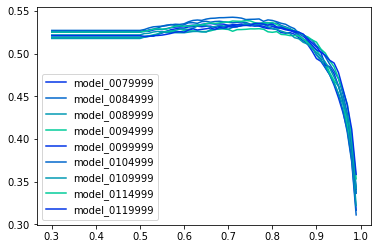

time: 21min 7s


In [44]:
# about 7 minutes each model (might be different depending on hardware configuration)
the_max_iters = [79999, 84999, 89999, 94999, 99999, 104999, 109999, 114999, 119999] #, 124999, 129999, 134999, 139999, 144999, 149999, 154999, 159999] # these are the latest checkpoints while training
the_model_names = [f"model_{str(iters).zfill(7)}" for iters in the_max_iters]
model_bests, threshold_bests, f1_bests = evaluate_models(cfg, eval_dicts, the_model_names)

# The best moodel info

In [45]:
print(f'The  best model is {the_model_names[np.argmax(model_bests)]}')
print(f'Its  score  threshold is {threshold_bests[np.argmax(model_bests)]}')
print(f'Its best f1 score is {max(model_bests)}')

The  best model is model_0104999
Its  score  threshold is 0.7100000000000004
Its best f1 score is 0.5425084175084176
time: 995 µs


# Use the best model to produce outputs

In [46]:
import numpy as np

from processing_utils import submissions_for_outputs

time: 789 µs


In [47]:
the_best_model = the_model_names[np.argmax(model_bests)]
the_model_name =  the_best_model
the_best_score_threshold = threshold_bests[np.argmax(model_bests)]
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, f"{the_model_name}.pth")

time: 988 µs


In [48]:
the_best_model

'model_0104999'

time: 1.43 ms


In [49]:
the_model_name

'model_0104999'

time: 1.45 ms


In [50]:
the_best_score_threshold

0.7100000000000004

time: 1.72 ms


### test1

In [51]:
# about 7 minutes (might be different depending on hardware configuration)
test1_output_items = predict(test1_dicts, cfg)

Done inferences in 4.36917705933253 minutes at 2020-10-23 06:58:16.072089
time: 4min 22s


In [52]:
file_name = f'test1'
test1_output_lines = submissions_for_outputs(file_name, test1_dicts, test1_output_items, score_thresh_test=the_best_score_threshold, top_n=5)

Written: test1_0.7100000000000004_20201023_065816.txt at 2020-10-23 06:58:16.821968
time: 735 ms


### test2

In [53]:
# about 7 minutes (might be different depending on hardware configuration)
test2_output_items = predict(test2_dicts, cfg)

Done inferences in 4.430996859073639 minutes at 2020-10-23 07:02:42.693487
time: 4min 25s


In [54]:
file_name = f'test2'
test2_output_lines = submissions_for_outputs(file_name, test2_dicts, test2_output_items, score_thresh_test=the_best_score_threshold, top_n=5)

Written: test2_0.7100000000000004_20201023_070243.txt at 2020-10-23 07:02:43.646760
time: 939 ms


# Visualizations
Visualize 10 images from each test dataset

In [55]:
# force reloading
import vis_utils
import importlib
importlib.reload(vis_utils)
from vis_utils import visualize_sample_outputs

time: 1.69 ms


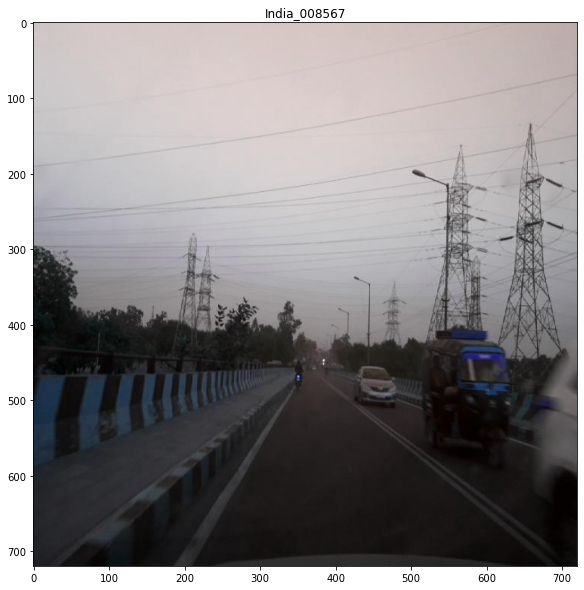

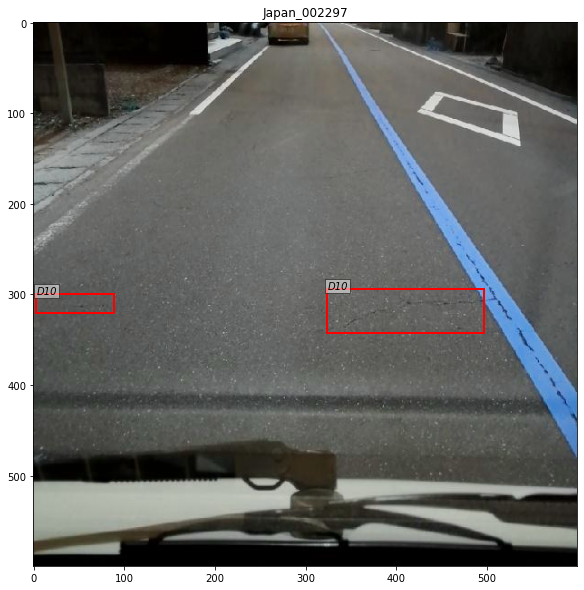

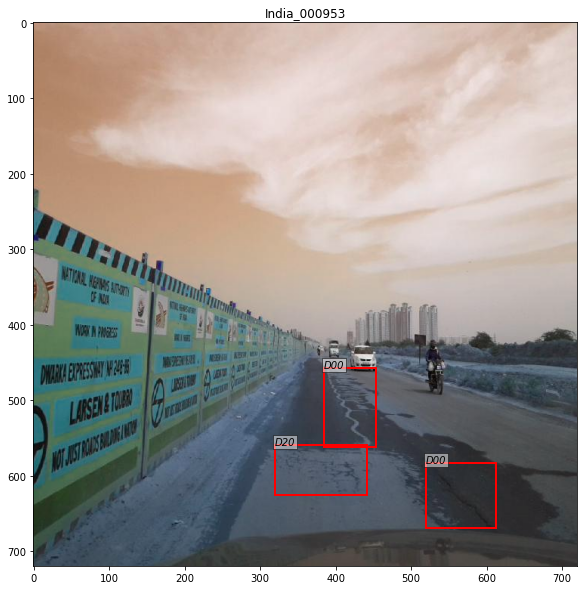

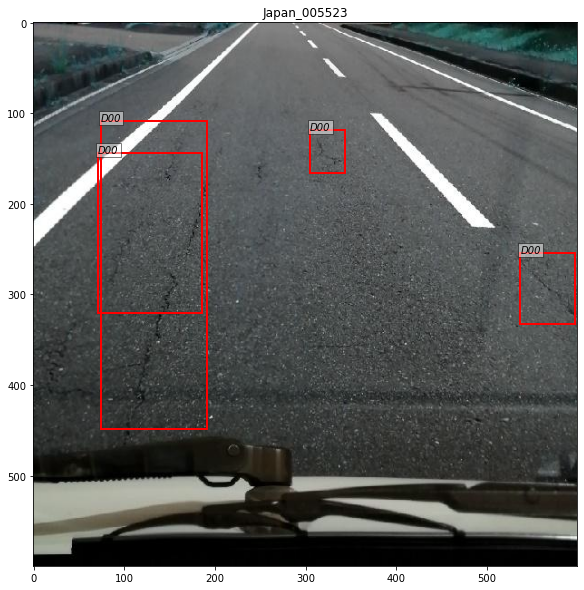

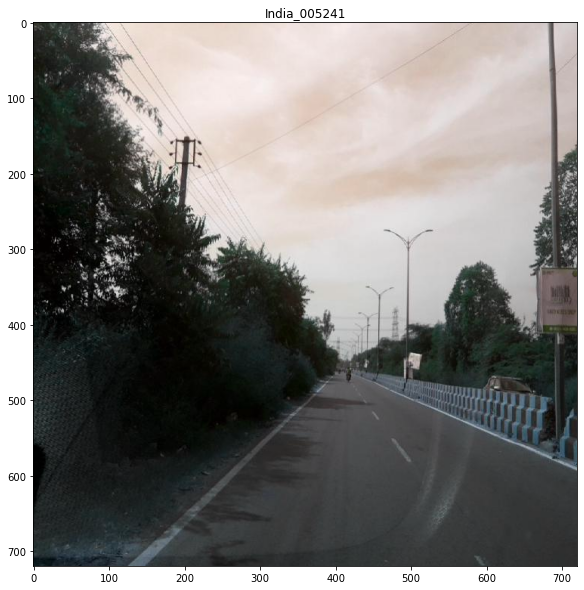

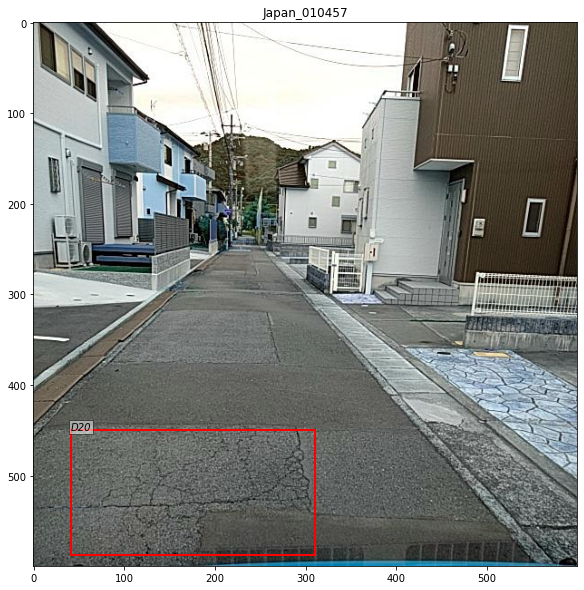

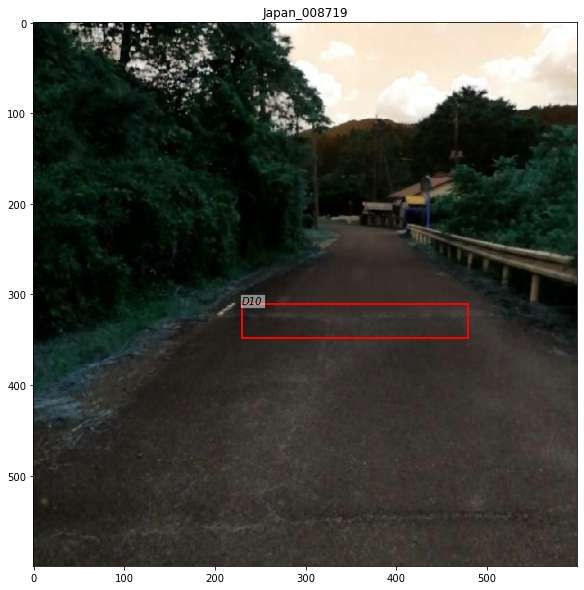

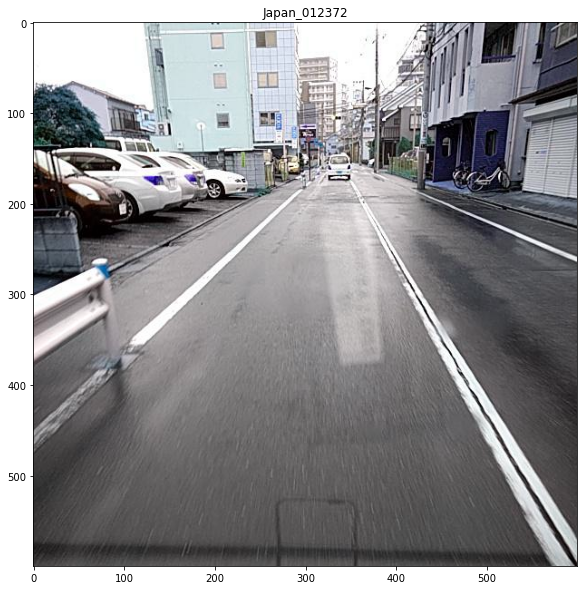

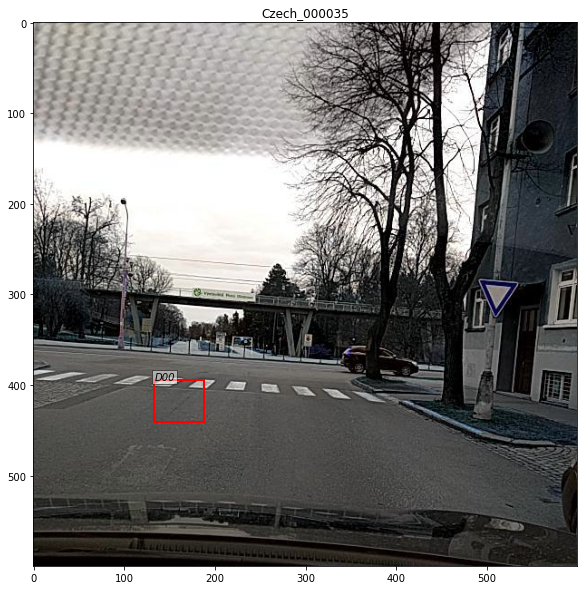

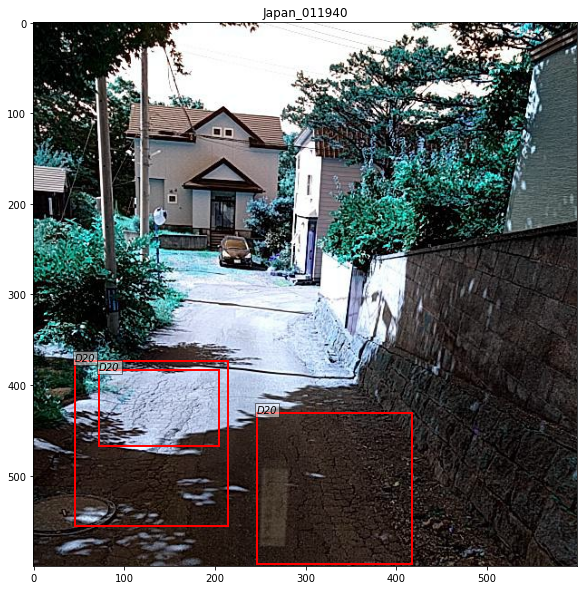

time: 2.46 s


In [56]:
visualize_sample_outputs(test1_dicts, test1_output_lines, 10)

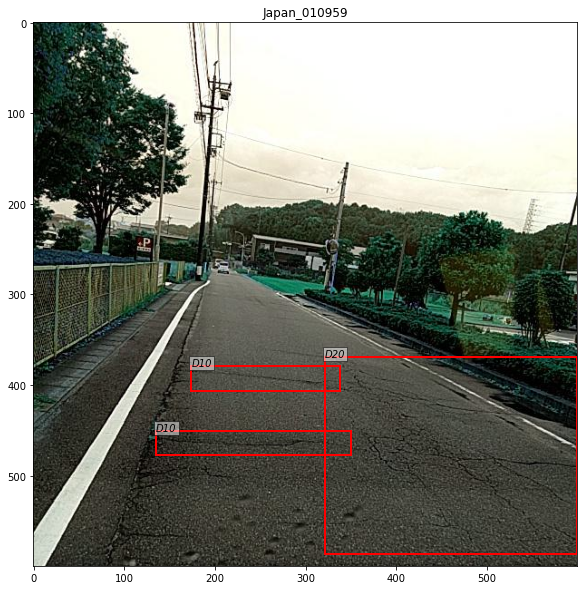

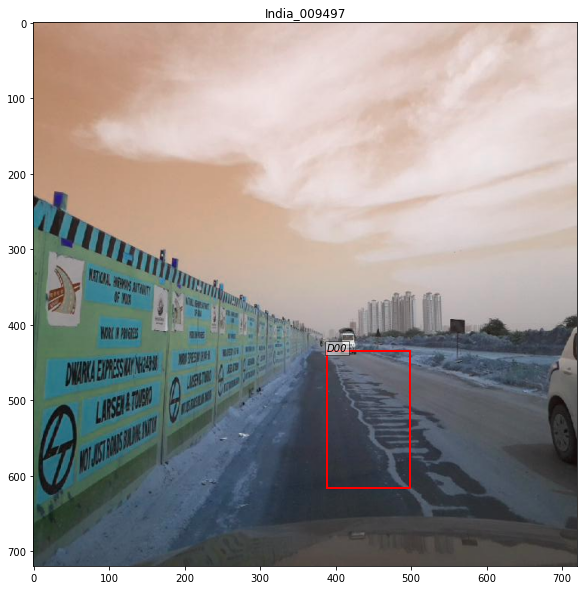

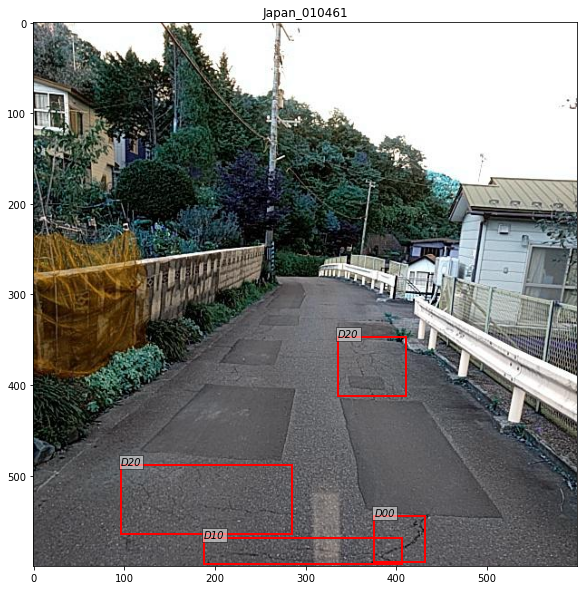

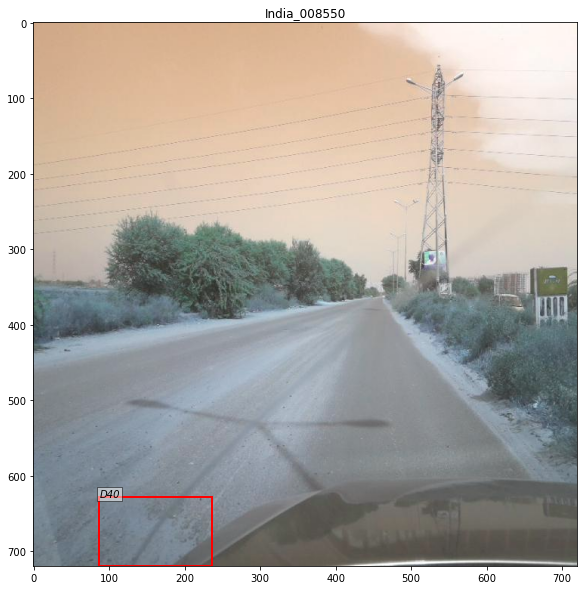

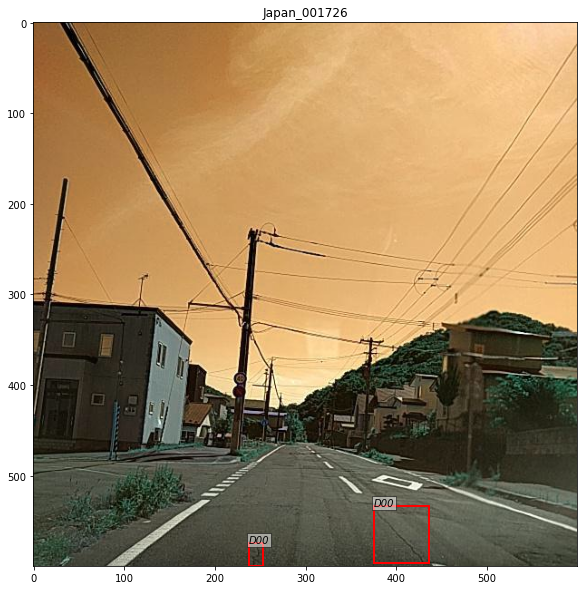

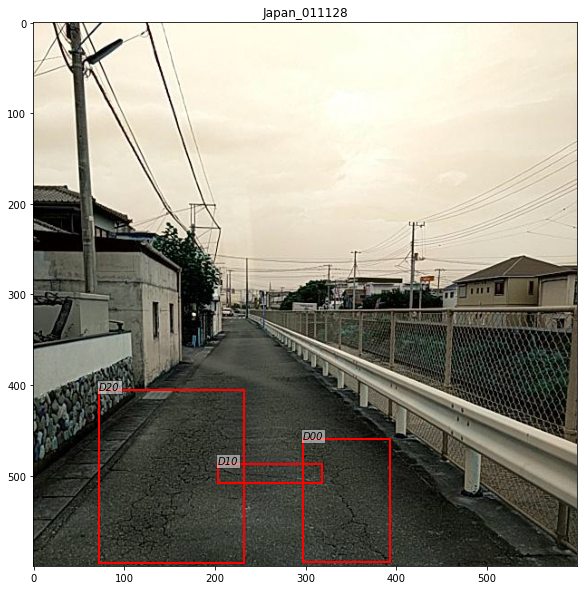

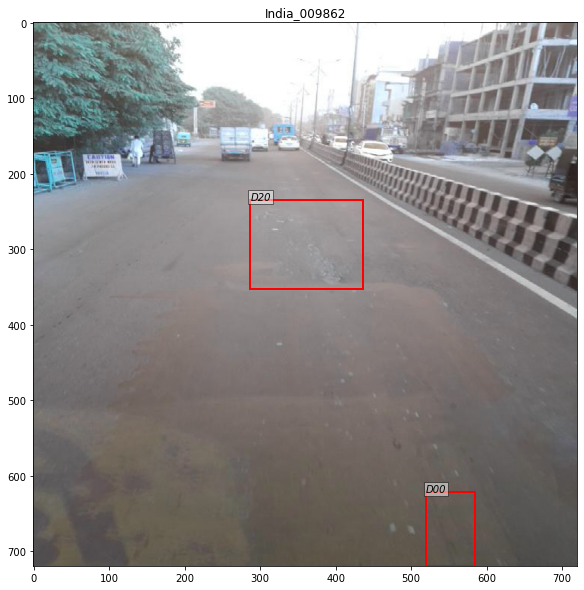

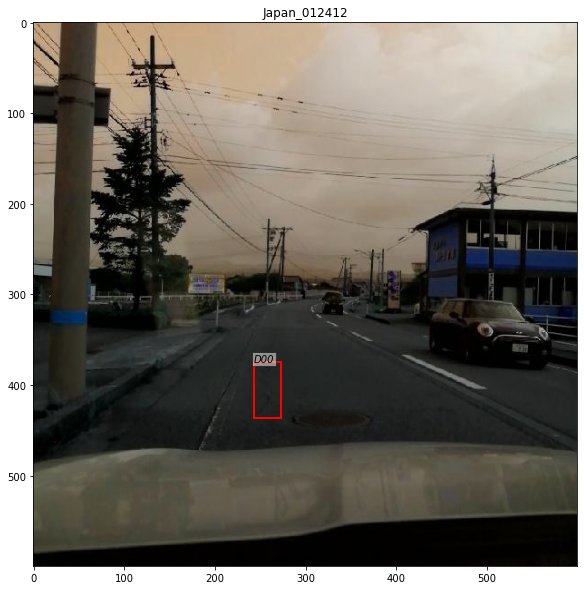

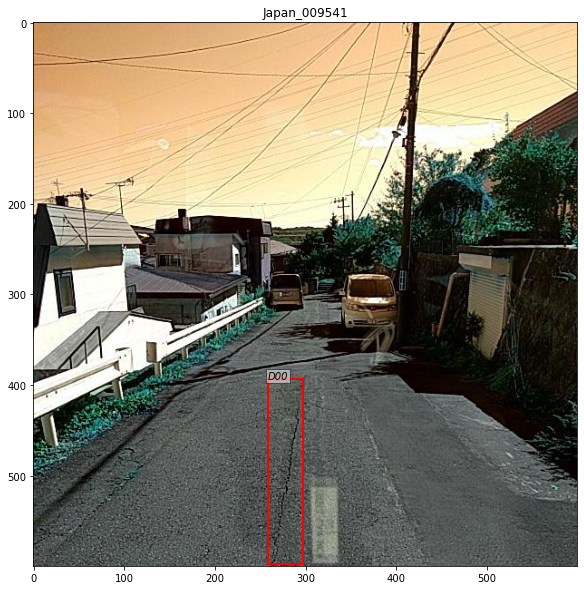

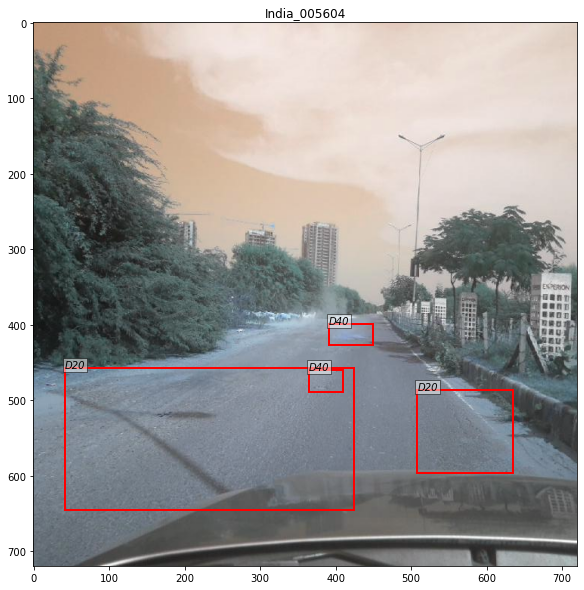

time: 2.49 s


In [57]:
visualize_sample_outputs(test1_dicts, test1_output_lines, 10)